# 06b - ANOVA to detect non-baseline msk and variable configurations with early signals of ACC
- author: Johannes L. Fjeldså
- email: johannes.larsen.fjeldså@nmbu.no

## Import libraries


In [3]:
from pathlib import Path
from src.preproces import *
from src.plotting import *
from src.create_masked_climatology import *
from src.heatmap import corrplot 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from tqdm import tqdm

from xclim import ensembles as ens
import pandas as pd
import xarray as xr
import re

file_handler = Handle_Files()

# Investigate Ensambles

Till now we have investigated advanced masking of: 'tas', 'pr', 'txxETCCDI', 'gslETCCDI', 'fdETCCDI', 'rx5dayETCCDI'. We have kept:
|                             	| **tas** 	| **pr** 	| **txxETCCDI** 	| **rx5dayETCCDI** 	| **gslETCCDI** 	| **fdETCCDI** 	|
|-----------------------------	|:-------:	|:------:	|:-------------:	|:----------------:	|:-------------:	|:------------:	|
| **nomask**                 	|    X    	|    X   	|       X       	|         X        	|       X       	|       X      	|
| **land_mask**              	|    X    	|    X   	|       X       	|         X        	|               	|              	|
| **sea_mask**                	|    X    	|    X   	|       X       	|         X        	|               	|              	|
| **lat_mask_30N_70N**       	|         	|        	|               	|                  	|       X       	|       X      	|
| **land_mask_30N_70N**      	|         	|        	|               	|                  	|       X       	|       X      	|
| **lat_mask_pm30deg**       	|         	|        	|       X       	|         X        	|               	|              	|
| **sea_mask_pm30deg**       	|         	|    X   	|       X       	|                  	|               	|              	|
| **pr_large_deviation_mask** 	|         	|    X   	|               	|         X        	|               	|              	|

In total we have 3375 combinations perform analysis on. 

In [4]:
def extract_realisation_number(file_name):
    match = re.search(r'r\d+', file_name)
    return int(match.group(0)[1:])

In [5]:
main_data_dir = 'D:/Programmering/msc/MSc_DataFiles_040424/AnnualGlobalClimatologies'
mask_names = file_handler.get_all_filenames_in_dir(main_data_dir)
SSPs = ['ssp126', 'ssp245', 'ssp370', 'ssp585']
data_frames = {scenario: {} for scenario in SSPs}

columns = []
for mask_name in mask_names:
    mask_data_dir = '/'.join([main_data_dir, mask_name])
    variables = file_handler.get_all_filenames_in_dir(mask_data_dir)
    for var in variables:
        columns.append(f'{var}: {mask_name}')

columns = sorted(columns, key=lambda x: (x.split(':')[0], x.split(':')[1]))
for scenario in SSPs:
    data_frames[scenario] = pd.DataFrame(columns=columns, index=range(1, 41))

for mask_name in mask_names:
    mask_data_dir = '/'.join([main_data_dir, mask_name])
    variables = file_handler.get_all_filenames_in_dir(mask_data_dir)

    for var in variables:

        for scenario in SSPs:
            data_dir = '/'.join([mask_data_dir, var, scenario])

            file_names = file_handler.get_all_netcdf_files_in_dir(data_dir)
            for file_name in file_names:
                indx = extract_realisation_number(file_name)
                ds = (
                    file_handler.read_netcdf_to_xr(directory=data_dir, file_name=file_name)
                    .sel(year=slice(2015, 2040))
                    .mean(dim='year')
                )
                data_frames[scenario].loc[indx, f'{var}: {mask_name}'] = ds[var].values.item()


In [7]:
print(data_frames['ssp126'].head())

  fdETCCDI: land_mask_30N_70N fdETCCDI: lat_mask_30N_70N fdETCCDI: nomask  \
1                  145.787965                  93.604361        55.506165   
2                  145.268317                  93.253562        55.028575   
3                   146.83891                  95.308685        55.632608   
4                  146.782447                  95.108373        56.161202   
5                  145.036182                  92.727776        55.176354   

  gslETCCDI: land_mask_30N_70N gslETCCDI: lat_mask_30N_70N gslETCCDI: nomask  \
1                   199.913366                  247.587954        293.831963   
2                   200.471215                  247.649604        294.206611   
3                   198.575929                  245.567644        293.611889   
4                   198.728655                  245.775027        293.214128   
5                   199.981971                  248.408723        294.052004   

  pr: land_mask pr: nomask pr: pr_large_deviation_mask p

# Investigate Correlation matrices

We will start by performing an anlysis of the correlation of varibales. The correlation betwenn varibles and masks will be taken within each SSP. A former analysis showed that there are some inter-year variation in the correlation matrices and so I use the mean value of baseline period of 2015-2030 in order to calculate the correlation matrix.

## Correlation matrix for each SSP

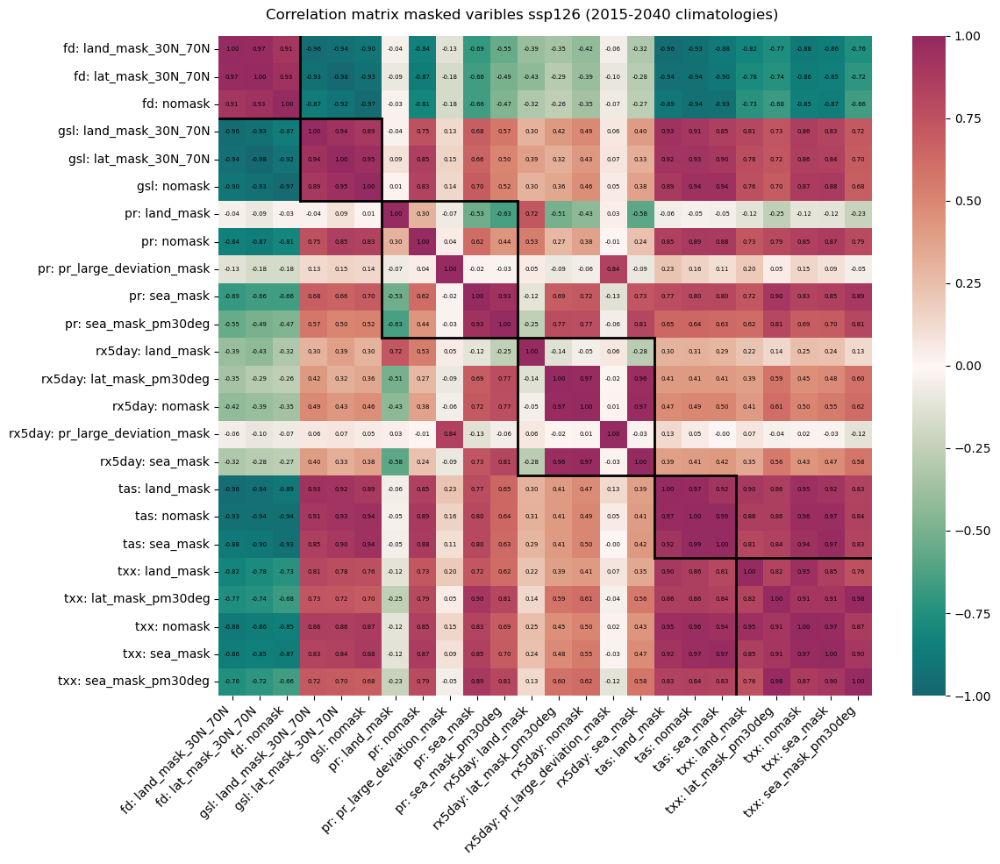

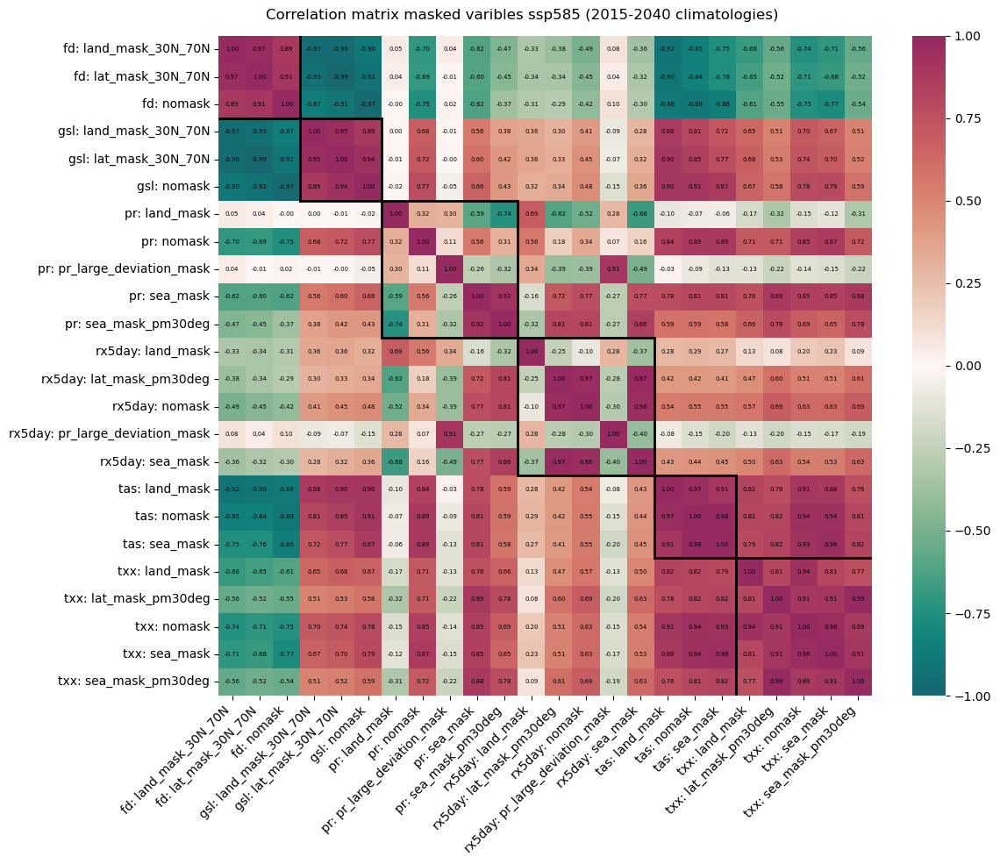

In [78]:
correlatin_matrices = {scenario: {} for scenario in SSPs}
cmap = cmocean.cm.curl
cmap = cmocean.tools.crop_by_percent(cmap, 30, which='both', N=None)


for scenario in SSPs:
    scenario_df = data_frames[scenario]
    old_columns = scenario_df.columns
    new_columns = [colname.replace('ETCCDI', '') for colname in old_columns]
    scenario_df.columns = new_columns
    correlation_matrix = scenario_df.corr()
    correlatin_matrices[scenario] = correlation_matrix
    fig, ax = plt.subplots(figsize=(12, 10))
    fig.suptitle(f'Correlation matrix masked varibles {scenario} (2015-2040 climatologies)', )
    #corrplot(correlation_matrix, size_scale=300)
    sns.heatmap(
        correlation_matrix,
        vmin=-1, 
        vmax=1, 
        annot=True, 
        annot_kws={'fontsize': 5, 'color': 'black'},
        fmt=".2f",
        cmap=cmap,
        )

    ax.axhline(y=3, xmin=0, xmax=(1/24)*6, color='black', linewidth=2)
    ax.axhline(y=6, xmin=(1/24)*3, xmax=(1/24)*11, color='black', linewidth=2) 
    ax.axhline(y=11, xmin=(1/24)*6, xmax=(1/24)*16, color='black', linewidth=2)
    ax.axhline(y=16, xmin=(1/24)*11, xmax=(1/24)*19, color='black', linewidth=2)
    ax.axhline(y=19, xmin=(1/24)*16, xmax=(1/24)*24, color='black', linewidth=2)
    ax.axvline(x=3, ymin=(1-(1/24)*6), ymax=1, color='black', linewidth=2)
    ax.axvline(x=6, ymin=(1-(1/24)*11), ymax=(1-(1/24)*3), color='black', linewidth=2)
    ax.axvline(x=11, ymin=(1-(1/24)*16), ymax=(1-(1/24)*6), color='black', linewidth=2)
    ax.axvline(x=16, ymin=(1-(1/24)*19), ymax=(1-(1/24)*11), color='black', linewidth=2)
    ax.axvline(x=19, ymin=(1-(1/24)*24), ymax=(1-(1/24)*16), color='black', linewidth=2)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
    plt.tight_layout()
    plt.show()


## Investigate differences in correltion matrices from scenarios

0.40745189197446363


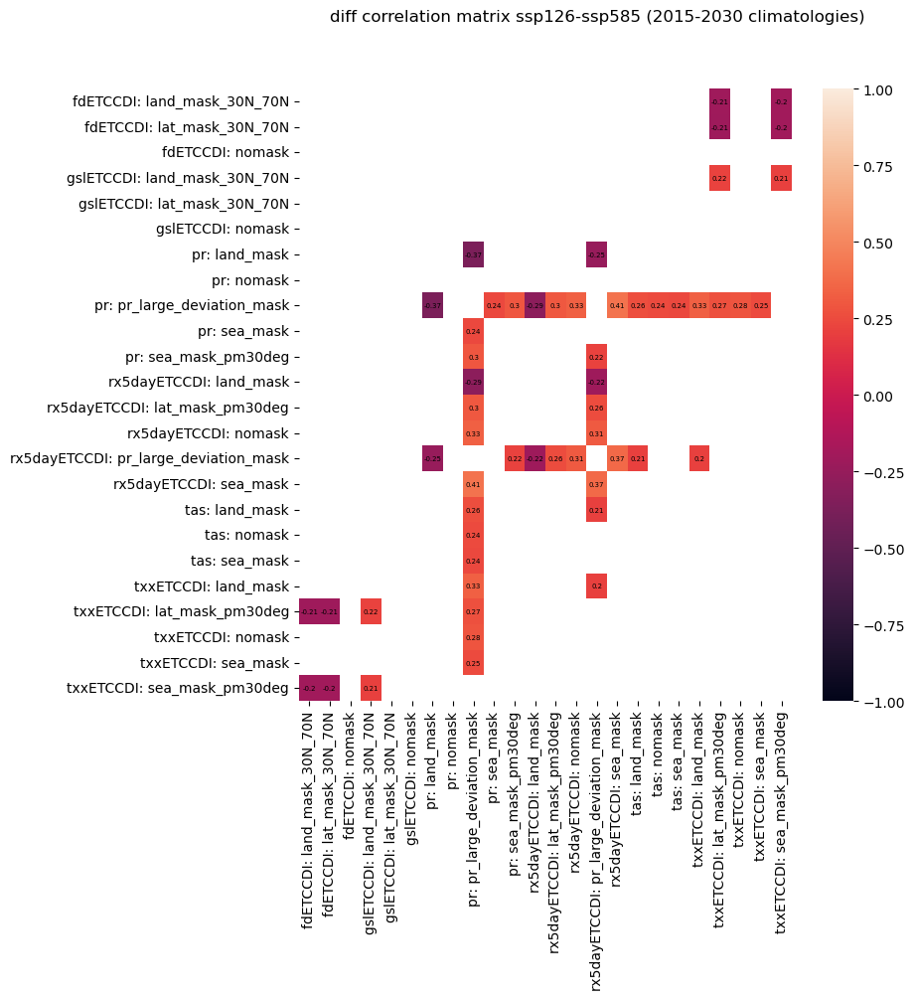

In [8]:
used_combinations = []
for scenario in SSPs:
    other_scenarios = [item for item in SSPs if item != scenario]

    for other_scenario in other_scenarios:
        combination = tuple(sorted([scenario, other_scenario]))

        if combination not in used_combinations:
            diff = correlatin_matrices[scenario] - correlatin_matrices[other_scenario]
            max_diff = np.max(np.abs(diff))

            if max_diff >= 0.3:
                print(max_diff)
                filtered_diff = diff.mask(np.abs(diff) < 0.2)                
                fig = plt.figure(figsize=(8, 8))
                fig.suptitle(f'diff correlation matrix {scenario}-{other_scenario} (2015-2030 climatologies)')
                sns.heatmap(filtered_diff,vmin=-1, vmax=1, annot=True, annot_kws={'fontsize': 5, 'color': 'black'})
                plt.show()   
            used_combinations.append(combination)
                 

There are no large differences in correlation, the largerst is .35

## Correlation matrix across SSPs

The largest differences in correlation between SSPs is all related to precipitation variables. That is, no pair of non-precipitation variables has a larger difference in correltion then $\sim|0.25|$ between SSPs. The differences is relatively small for most 'var: mask' combinations between SSPs. We therefor use the mean across 2015-2030 and include all SSPs in the table for correlation matrix calculation.

In [28]:

scenario_indx_key = {'ssp126': 0, 'ssp585': 1}

# add SSP as column for each df
for scenario, df in data_frames.items():
    df['scenario'] = scenario
    df['scenario_indx'] = scenario_indx_key[scenario]
    df = df.reindex(columns=['scenario', 'scenario_indx'] + [col for col in df.columns if col not in ['scenario', 'scenario_indx']])
    data_frames[scenario] = df

# concat the dfs vertically
all_SSPs_df = pd.concat(data_frames.values())
all_SSPs_df.head()

,scenario,scenario_indx,fdETCCDI: land_mask_30N_70N,fdETCCDI: lat_mask_30N_70N,fdETCCDI: nomask,gslETCCDI: land_mask_30N_70N,gslETCCDI: lat_mask_30N_70N,gslETCCDI: nomask,pr: land_mask,pr: nomask,...,rx5dayETCCDI: pr_large_deviation_mask,rx5dayETCCDI: sea_mask,tas: land_mask,tas: nomask,tas: sea_mask,txxETCCDI: land_mask,txxETCCDI: lat_mask_pm30deg,txxETCCDI: nomask,txxETCCDI: sea_mask,txxETCCDI: sea_mask_pm30deg
1,ssp126,0,146.772039,94.236957,55.939877,198.767694,246.69988,293.3192,0.000029,0.000038,...,107.204499,115.447787,283.716945,288.936232,291.043994,32.796525,32.254317,25.93496,23.16101,28.983077
2,ssp126,0,146.934256,94.691248,55.26968,198.491213,245.714622,293.805748,0.000029,0.000038,...,102.47749,114.530695,283.747235,288.970654,291.079518,32.79148,32.284426,25.951137,23.181019,28.998871
3,ssp126,0,149.609471,97.378466,56.334064,195.917752,243.541949,292.89515,0.000029,0.000038,...,102.253429,115.108795,283.560354,288.874035,291.021128,32.639545,32.175792,25.872307,23.132517,28.934642
4,ssp126,0,148.079206,96.154432,56.624984,196.839083,244.35289,292.737836,0.000029,0.000038,...,105.84114,113.511676,283.591963,288.8284,290.945455,32.640673,32.126102,25.81962,23.056179,28.883665
5,ssp126,0,145.66035,93.818785,55.532562,198.892771,246.778261,293.437963,0.000029,0.000038,...,103.456398,113.7018,283.712652,288.943944,291.055204,32.638831,32.240713,25.887856,23.151643,28.969105


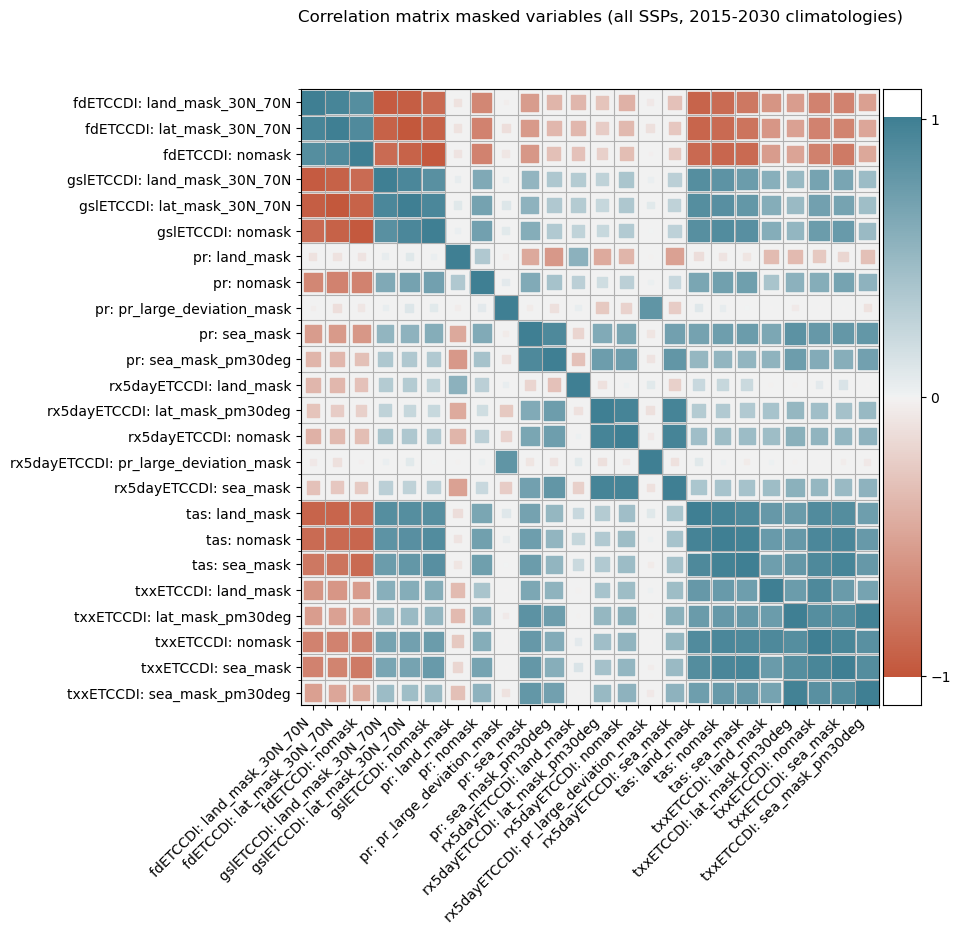

In [29]:
correlation_matrix = all_SSPs_df[[col for col in all_SSPs_df.columns if col not in ['scenario', 'scenario_indx']]].corr()
fig = plt.figure(figsize=(8, 8))
fig.suptitle(f'Correlation matrix masked variables (all SSPs, 2015-2030 climatologies)')
corrplot(correlation_matrix, size_scale=265)
plt.show()


The high correlation found within each variables (outlined bellow) suggest that it is not wise to include features from the same variable as ML models often expect independent features. An exeption can maby be made within the precipitation masks as these has lower correlation. The features concerned witht temperature (tas and txx) might leed to problems in combinations, this is also true for fd-gsl combinations. This will be handled by built in regularisation in the ML models. 

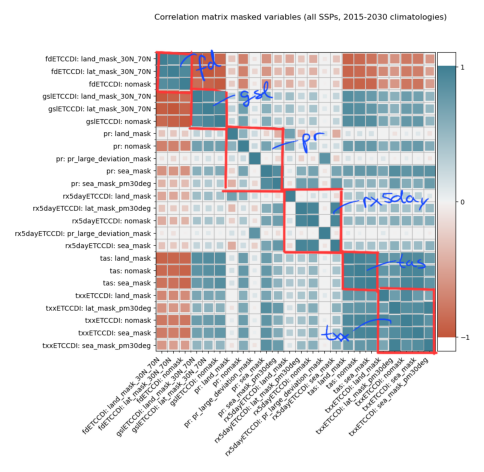

In [61]:
disp_external_fig('/nird/home/johannef/Masterthesis_S23/External figs/correlation_matrix_allvarmaskcombs_allSSPs_2015-2030clim.png', wanted_height=6)

# Feature selection

In [18]:
from sklearn.preprocessing import StandardScaler

We have to start by extracting cross sections for the range of years: 2015-2060

In [32]:
# NB takes a long time to run, import from '/nird/home/johannef/Masterthesis_S23 DataFiles/tables/cross_sections/' instead
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/AnnualGlobalClimatologies'
mask_names = file_handler.get_all_filenames_in_dir(main_data_dir)
SSPs = ['ssp126', 'ssp245', 'ssp370', 'ssp585']
#scenario_indx_key = {'ssp126': 1, 'ssp245': 2, 'ssp370': 3, 'ssp585': 4}

years = list(range(2015, 2101))
data_frames = {year: {} for year in years}


columns = []
for mask_name in mask_names:
    mask_data_dir = '/'.join([main_data_dir, mask_name])
    variables = file_handler.get_all_filenames_in_dir(mask_data_dir)
    for var in variables:
        columns.append(f'{var}: {mask_name}')

columns = sorted(columns, key=lambda x: (x.split(':')[0], x.split(':')[1]))

for year in years:
    for scenario in SSPs:
        data_frames[year][scenario] = pd.DataFrame(columns=columns, index=range(1, 41))
        data_frames[year][scenario]['scenario'] = scenario
        #data_frames[year][scenario]['scenario_indx'] = scenario_indx_key[scenario]

for year in tqdm(years):
    for mask_name in mask_names:
        mask_data_dir = '/'.join([main_data_dir, mask_name])
        variables = file_handler.get_all_filenames_in_dir(mask_data_dir)

        for var in variables:

            for scenario in SSPs:
                data_dir = '/'.join([mask_data_dir, var, scenario])

                file_names = file_handler.get_all_netcdf_files_in_dir(data_dir)
                for file_name in file_names:
                    indx = extract_realisation_number(file_name)
                    ds = (
                        file_handler.read_netcdf_to_xr(directory=data_dir, file_name=file_name)
                        .sel(year=year)
                    )
                    data_frames[year][scenario].loc[indx, f'{var}: {mask_name}'] = ds[var].values.item()

save_folder = '/nird/home/johannef/Masterthesis_S23 DataFiles/tables/cross_sections/unscaled'
save_folder_scaled = '/nird/home/johannef/Masterthesis_S23 DataFiles/tables/cross_sections/standardscaled'

features = [col for col in data_frames[2015]['ssp126'].columns if col not in ['scenario']]
scaler = StandardScaler()

for year in years:
    all_SSPs_df = pd.concat(data_frames[year].values(), ignore_index=True)
    all_SSPs_df.to_csv('/'.join([save_folder, f'cross_section_{year}.csv']), index=False)

    all_SSPs_df_scaled = all_SSPs_df
    all_SSPs_df_scaled[features] = scaler.fit_transform(all_SSPs_df_scaled[features])
    all_SSPs_df_scaled.to_csv('/'.join([save_folder_scaled, f'cross_section_{year}_standscaled.csv']), index=False)

100%|██████████| 86/86 [11:03<00:00,  7.72s/it]


In [21]:
# NB takes a long time to run, import from '/nird/home/johannef/Masterthesis_S23 DataFiles/tables/cross_sections/' instead
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/AnnualGlobalClimatologies'
mask_names = file_handler.get_all_filenames_in_dir(main_data_dir)
SSPs = ['ssp126', 'ssp245', 'ssp370', 'ssp585']
#scenario_indx_key = {'ssp126': 0, 'ssp585': 1}

data_frames = {scenario: {} for scenario in SSPs}


columns = []
for mask_name in mask_names:
    mask_data_dir = '/'.join([main_data_dir, mask_name])
    variables = file_handler.get_all_filenames_in_dir(mask_data_dir)
    for var in variables:
        columns.append(f'{var}: {mask_name}')

columns = sorted(columns, key=lambda x: (x.split(':')[0], x.split(':')[1]))

for scenario in SSPs:
    data_frames[scenario] = pd.DataFrame(columns=columns, index=range(1, 41))
    data_frames[scenario]['scenario'] = scenario
    #data_frames[scenario]['scenario_indx'] = scenario_indx_key[scenario]

for mask_name in tqdm(mask_names):
    mask_data_dir = '/'.join([main_data_dir, mask_name])
    variables = file_handler.get_all_filenames_in_dir(mask_data_dir)

    for var in variables:

        for scenario in SSPs:
            data_dir = '/'.join([mask_data_dir, var, scenario])

            file_names = file_handler.get_all_netcdf_files_in_dir(data_dir)
            for file_name in file_names:
                indx = extract_realisation_number(file_name)
                ds = (
                    file_handler.read_netcdf_to_xr(directory=data_dir, file_name=file_name)
                    .sel(year=slice(2030, 2040))
                    .mean(dim='year')
                )
                data_frames[scenario].loc[indx, f'{var}: {mask_name}'] = ds[var].values.item()

save_folder = '/nird/home/johannef/Masterthesis_S23 DataFiles/tables/cross_sections/unscaled'
save_folder_scaled = '/nird/home/johannef/Masterthesis_S23 DataFiles/tables/cross_sections/standardscaled'

features = [col for col in data_frames['ssp126'].columns if col not in ['scenario', 'scenario_indx']]
scaler = StandardScaler()

all_SSPs_df = pd.concat(data_frames.values(), ignore_index=True)
all_SSPs_df.to_csv('/'.join([save_folder, f'cross_section_meanof2030to2040.csv']), index=False)

all_SSPs_df_scaled = all_SSPs_df
all_SSPs_df_scaled[features] = scaler.fit_transform(all_SSPs_df_scaled[features])
all_SSPs_df_scaled.to_csv('/'.join([save_folder_scaled, f'cross_section_meanof2030to2040_standscaled.csv']), index=False)

100%|██████████| 8/8 [00:13<00:00,  1.73s/it]


Now we can import the tables from '/nird/home/johannef/Masterthesis_S23 DataFiles/tables/cross_sections'

## Visual analysis

In [60]:
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
from src.helperfunctions_ML import open_cross_sections

### Pairplots

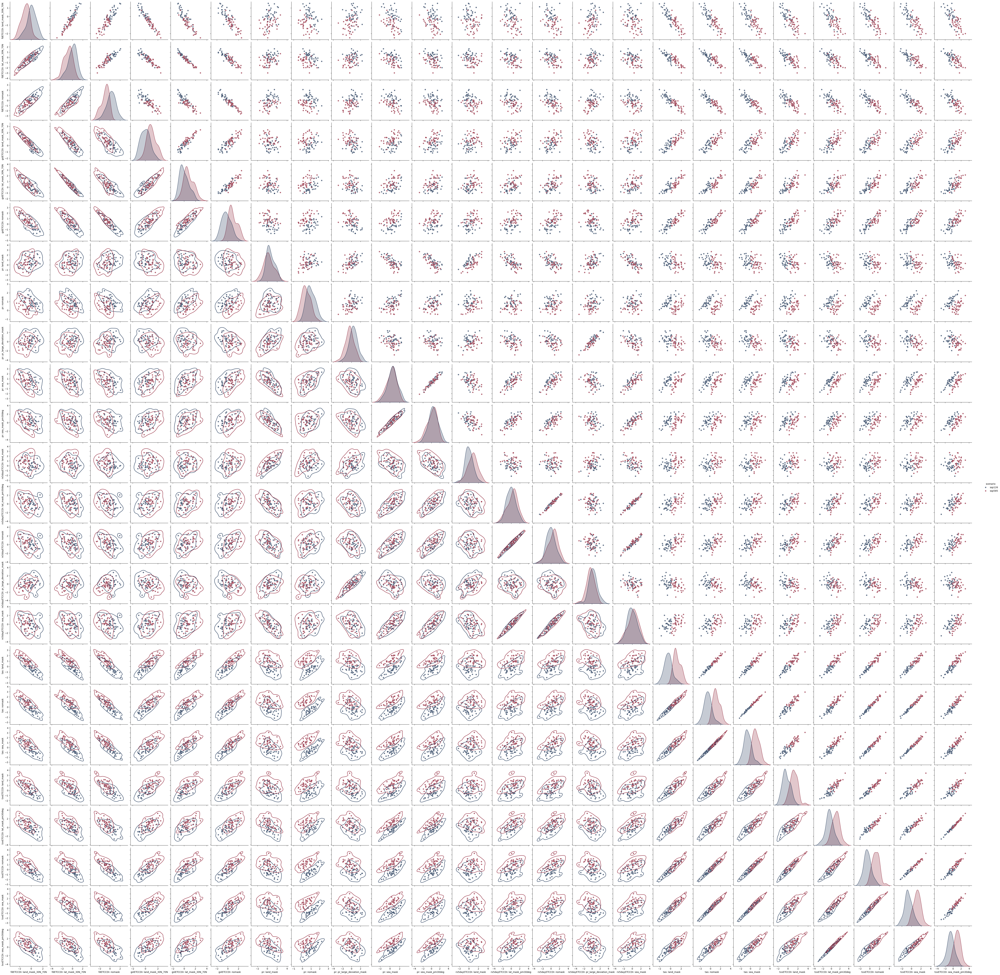

In [76]:
scenario_indx_key = {'ssp126': 0, 'ssp585': 1}
selected_features = [col for col in scaled_cross_sections[2015].columns if col not in ['scenario', 'scenario_indx']]
scaled_cross_section_meanof2030to2040 = pd.read_csv('D:/Programmering/msc/MSc_DataFiles_040424/tables/cross_sections/standardscaled/cross_section_meanof2030to2040_standscaled.csv')
#scaled_cross_section_meanof2030to2040 = scaled_cross_section_meanof2030to2040[selected_features+['scenario']]
scaled_cross_section_meanof2030to2040 = scaled_cross_section_meanof2030to2040[scaled_cross_section_meanof2030to2040['scenario'].isin(['ssp126', 'ssp585'])]
scaled_cross_section_meanof2030to2040['scenario_indx'] = scaled_cross_section_meanof2030to2040['scenario'].map(scenario_indx_key)
scaled_cross_section_meanof2030to2040['scenario_indx'] = scaled_cross_section_meanof2030to2040['scenario_indx'].astype('Int64')

color_map = {'ssp126': '#1c3354', 
             'ssp585': '#8f2035'}

g = sns.pairplot(
    scaled_cross_section_meanof2030to2040[selected_features+['scenario']], 
    hue='scenario', 
    plot_kws={'alpha': .7},
    palette=color_map
    )
g.map_lower(
    sns.kdeplot, 
    levels=2, 
    color=".2"
    )

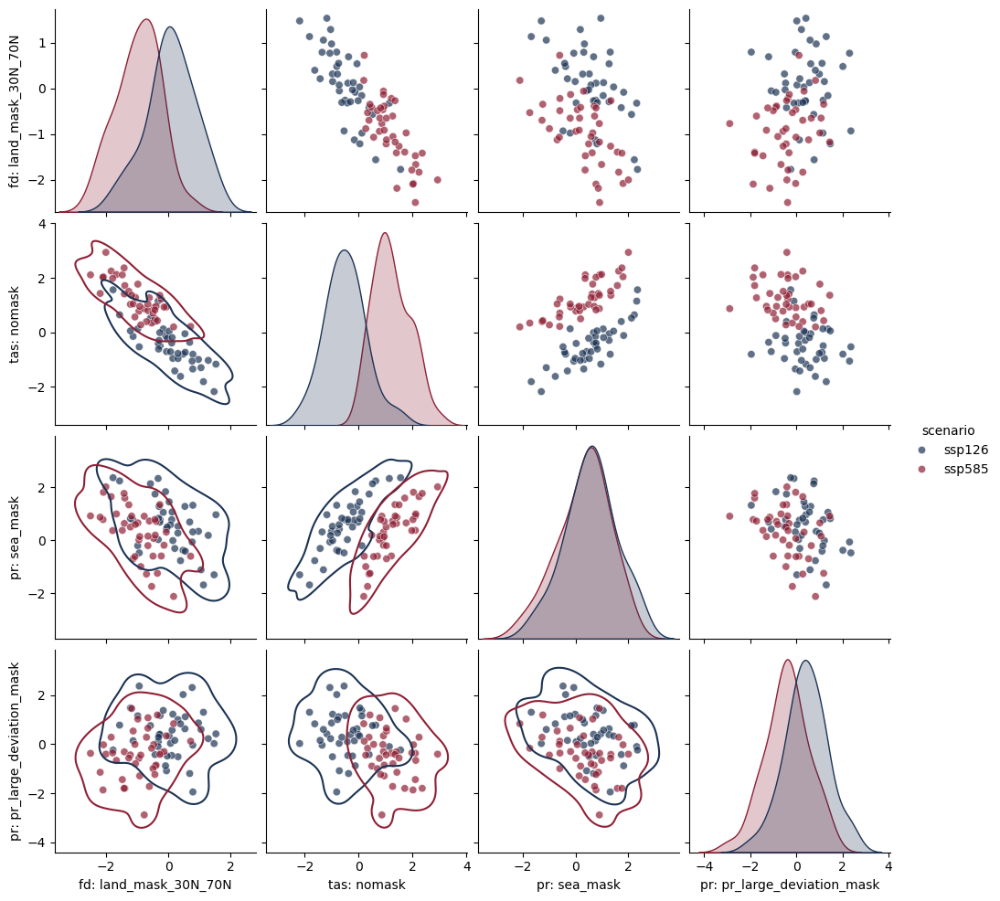

In [86]:
scenario_indx_key = {'ssp126': 0, 'ssp585': 1}
selected_features = ['fd: land_mask_30N_70N', 'tas: nomask', 'pr: sea_mask', 'pr: pr_large_deviation_mask']
scaled_cross_section_meanof2030to2040 = pd.read_csv('D:/Programmering/msc/MSc_DataFiles_040424/tables/cross_sections/standardscaled/cross_section_meanof2030to2040_standscaled.csv')
#scaled_cross_section_meanof2030to2040 = scaled_cross_section_meanof2030to2040[selected_features+['scenario']]
scaled_cross_section_meanof2030to2040 = scaled_cross_section_meanof2030to2040[scaled_cross_section_meanof2030to2040['scenario'].isin(['ssp126', 'ssp585'])]
old_columns = scaled_cross_section_meanof2030to2040.columns
new_columns = [col.replace('ETCCDI', '') for col in old_columns]
scaled_cross_section_meanof2030to2040.columns = new_columns
scaled_cross_section_meanof2030to2040['scenario_indx'] = scaled_cross_section_meanof2030to2040['scenario'].map(scenario_indx_key)
scaled_cross_section_meanof2030to2040['scenario_indx'] = scaled_cross_section_meanof2030to2040['scenario_indx'].astype('Int64')

color_map = {'ssp126': '#1c3354', 
             'ssp585': '#8f2035'}

g = sns.pairplot(
    scaled_cross_section_meanof2030to2040[selected_features+['scenario']], 
    hue='scenario', 
    plot_kws={'alpha': .7},
    palette=color_map
    )
g.map_lower(
    sns.kdeplot, 
    levels=2, 
    color=".2"
    )

## catplot

In [8]:
SSPs = ['ssp126', 'ssp585']
plot_years = [2020, 2030, 2040, 2050]
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/AnnualGlobalClimatologies'
all_masks = file_handler.get_all_filenames_in_dir(main_data_dir)
variables = file_handler.get_all_filenames_in_dir(f'{main_data_dir}/nomask')
available_masks_in_var = {var: [mask for mask in all_masks if var in file_handler.get_all_filenames_in_dir(f'{main_data_dir}/{mask}')] for var in variables}

catplot_dfs = {}
for var, masks in available_masks_in_var.items():

    var_df = pd.DataFrame(columns=['year', 'feature', 'value', 'scenario', 'scenario_indx'])
    for year in years:
        cross_section = cross_sections[year]
        for mask in masks:
            feature = f'{var}: {mask}'
            mask_data = pd.DataFrame({
                'year': [year for _ in range(80)],
                'feature': [feature for _ in range(80)],
                'value': cross_section[feature],
                'scenario': cross_section['scenario'],
                'scenario_indx': cross_section['scenario_indx']
            })
            var_df = pd.concat([var_df, mask_data], ignore_index=True)

    catplot_dfs[var] = var_df

/tmp/ipykernel_378486/2831129666.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  var_df = pd.concat([var_df, mask_data], ignore_index=True)
/tmp/ipykernel_378486/2831129666.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  var_df = pd.concat([var_df, mask_data], ignore_index=True)
/tmp/ipykernel_378486/2831129666.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA column

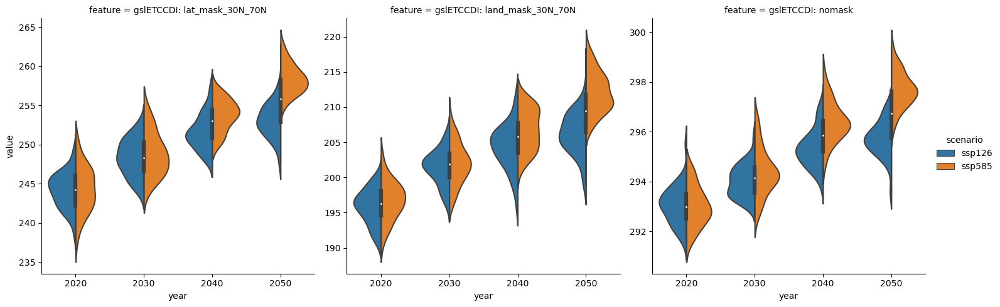

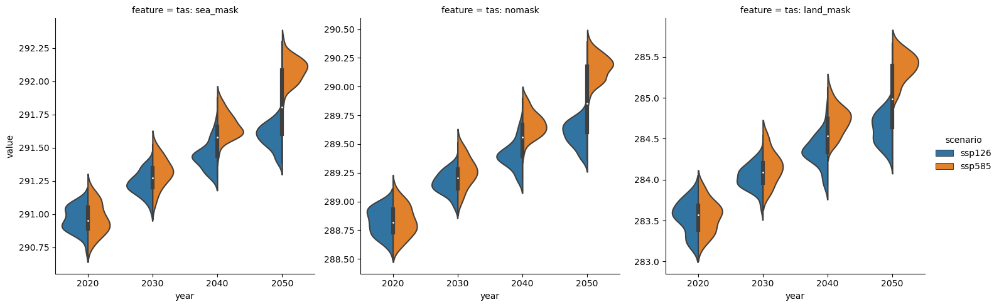

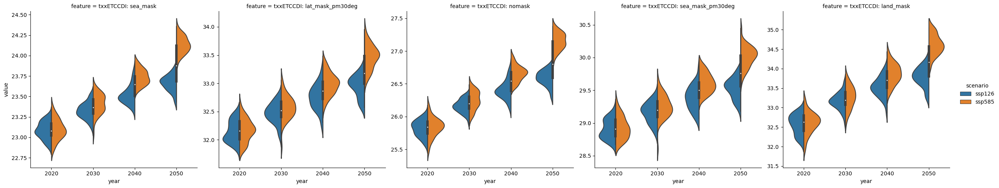

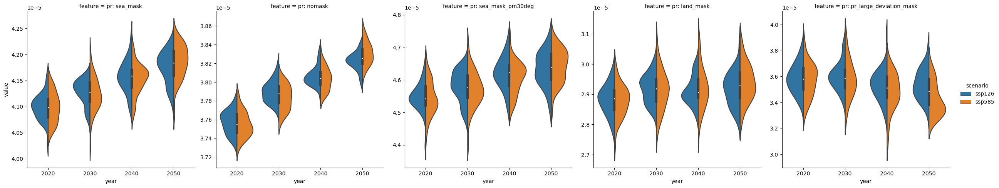

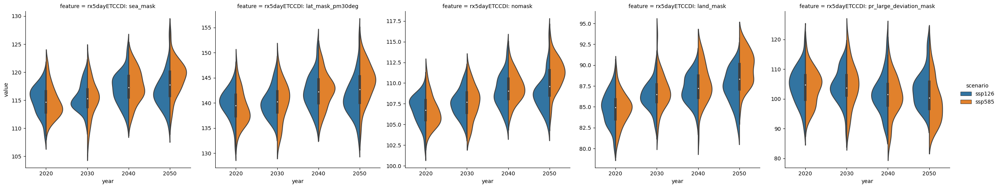

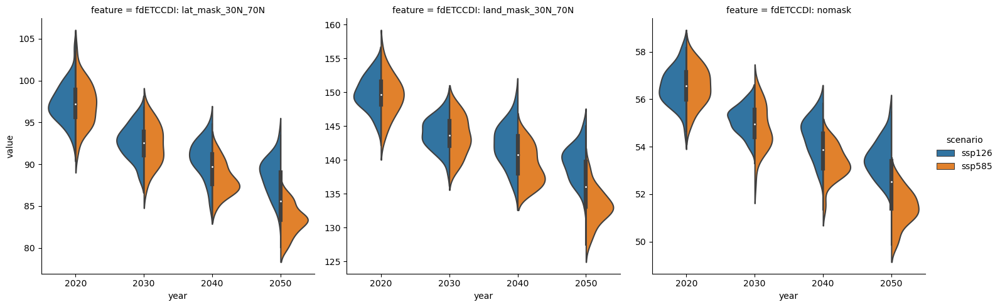

In [12]:
plot_year = [2020, 2030, 2040, 2050]
color_map = {'SSP1-2.6': '#1c3354', 
             'SSP5-8.5': '#8f2035'}

for var, masks in available_masks_in_var.items():
    data = catplot_dfs[var][catplot_dfs[var]['year'].isin(plot_years)]

    sns.catplot(
        data=data, 
        x="year", 
        y='value', 
        hue="scenario", 
        col='feature', 
        kind="violin", 
        split=True, 
        sharey=False,
        palette=color_map,
    )
    
    plt.show()

### Using visual analysis of ensambles

<frozen importlib._bootstrap>:241: RuntimeWarning: numpy.ndarray size changed, may indicate binary incompatibility. Expected 16 from C header, got 96 from PyObject


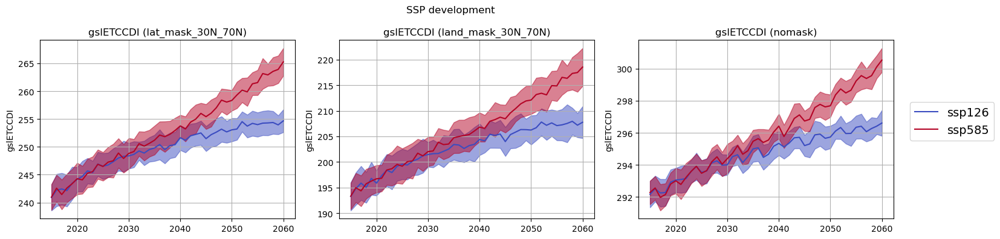

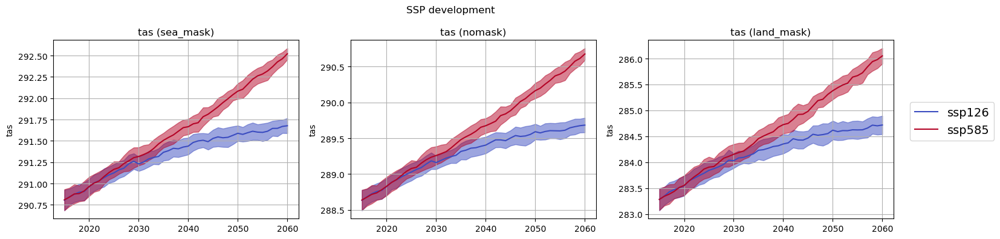

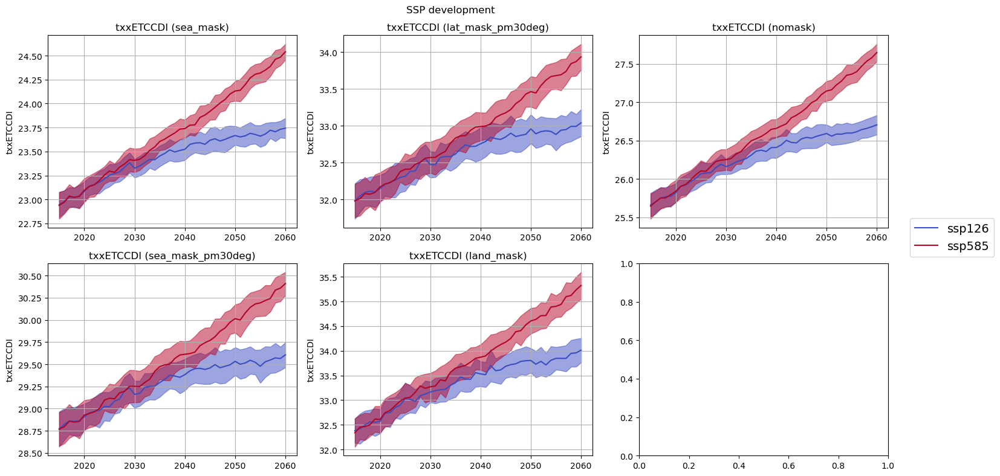

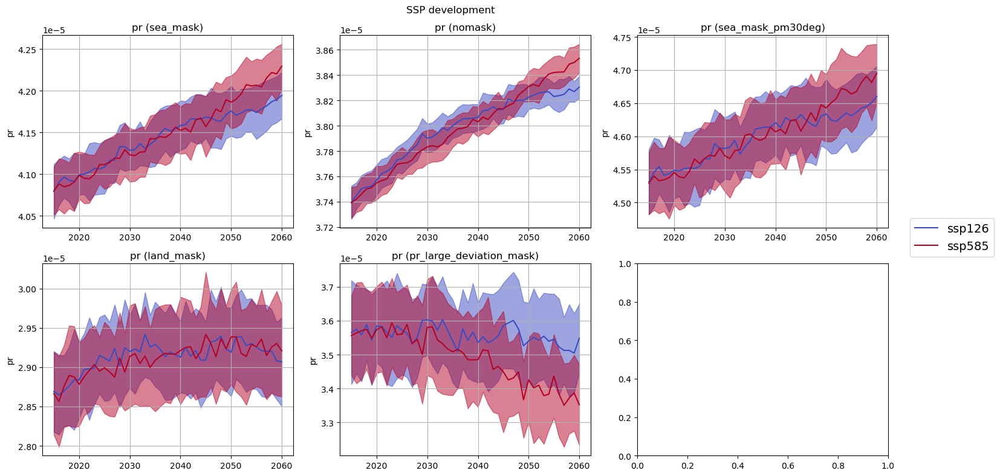

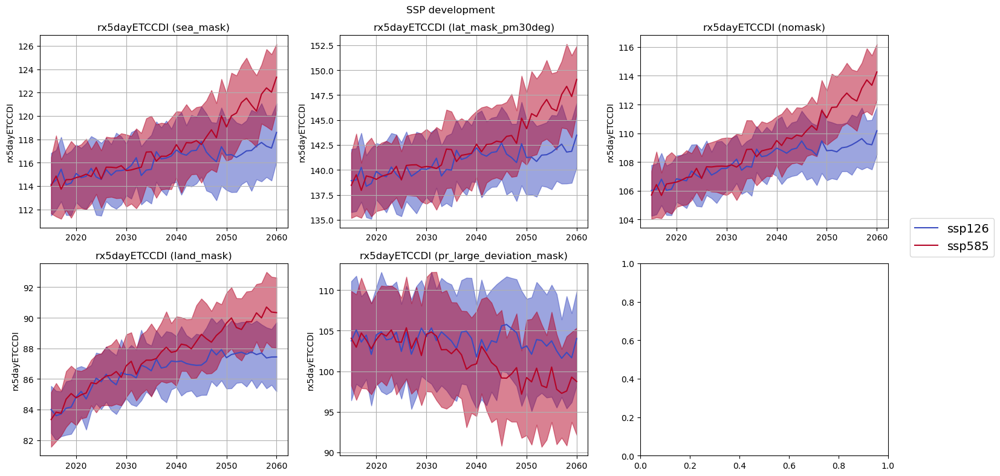

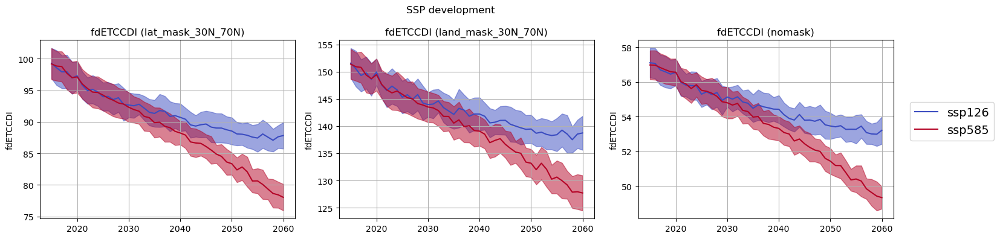

In [8]:
main_data_dir = '/nird/home/johannef/Masterthesis_S23 DataFiles/AnnualGlobalClimatologies'
SSPs = ['ssp126', 'ssp585']
all_masks = file_handler.get_all_filenames_in_dir(main_data_dir)
variables = file_handler.get_all_filenames_in_dir(f'{main_data_dir}/nomask')
available_masks_in_var = {var: [mask for mask in all_masks if var in file_handler.get_all_filenames_in_dir(f'{main_data_dir}/{mask}')] for var in variables}
available_masks_in_var

for var, mask_names in available_masks_in_var.items():
    plot_annual_global_ensambles(main_data_dir, SSPs, var,
                                 mask_names, temporal_range=(2015, 2060), show_fig2=False)

It is hard to conclude on which configurations of variables seems most viable. My suggestion based on the visual analysis is:
- we do not want to many highly correlated features. Therefor I select only one feature from each variable except from the precipitation variables.
- fd and gsl are highly correlated with eachother and all temperature variables, in addition gsl shows a weird dynamic. I therefore choose fdETCCDI: nomask as the only feature from these two variables. This is because the ensamble time series seems to have the higest SNR and the pairplot yields most ensamble members outside of the levels (countours)
- from precipitation (pr) I choose pr: nomask and pr: seamask and rx5day: landmask
- from tas I choose nomask as it seems to interact similary to the other tas but has more available data then other mask (real vowrld data)
- from txx i Choose seamasked 
to sum we get ['fdETCCDI: nomask', 'pr: nomask', 'pr: sea_mask', 'rx5dayETCCDI: land_mask', 'tas: nomask', 'txxETCCDI: sea_mask']

We will let feature selection algs. decide for us. As we are using a cross sectional approach we will get different significance for each feature each year (cross section). The ensamble and earlier analysis show that we will have to assume a sucsesfull classification towards the later part of early period. Therefor the features that are most important in the years 2030-2040 are the most interesting ones. Since it is somewhat artificial to choose the ones that performes best on each individual cross section (dynamic features, one selection per year) in the context of using the model for real data classification we stick to the cumulative importance for 2030-2040. 

## Using Boruta-shap algorithm
(qualitativ description from [Classification models combined with Boruta feature selection for heart disease prediction](https://www.sciencedirect.com/science/article/pii/S2352914823002885))
The Boruta algorithm proceeds as follows:
1. Include all of the original features to begin the feature set.
2. By randomly permuting the values of the original features, create shadow features.
3. Train a machine learning model using both the original and shadow features combined.
4. By contrasting it with the relevance of its shadow aspects, evaluate the significance of each original feature. Numerous metrics, including Gini impurity, information gain, and feature weights, can be used to quantify relevance.
5. Using a predetermined threshold, decide whether a characteristic is statistically significant or not. A feature is deemed statistically significant if its importance exceeds the sum of the importance of its shadow characteristics. 
6. Eliminate unnecessary features from the feature list.
7. Continue with steps 2 through 6 until all features have been accepted or denied. 

Here we apply the random forest inpurity importance in order to score the features. From the boruta alg we also get rejection statements based on the feature importance compared to its shadow features these can also be plotted. From the alg. a 2 is an accepted feature and 3 is an rejected one, we make a cumulative plot for 2030-2040. 

The boruta-shap alg is mode-spesific therefor we have to train a model for each cross section before applying boruta on the shap values. We will use boruta-shap on:
- Random forest (RF) classifier
- XGBoost (XGB) classifier

(NOTE: I have altered Boruta-shap src code by 1. turning of tqdm for iterations in the fit function. 2. adding title feeding and option to return figure from BorutaShap.plot function)

### Random forest classifier

In [1]:
import numpy as np
import pandas as pd

from src.helperfunctions_ML import run_boruta_shap, open_cross_sections

scaled_cross_sections = open_cross_sections(scaled=True)

/nird/home/johannef/.conda/msc_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


reduce the param grid and rand search params in order to bring down training time of RF as this is an initial analysis in order to detect features and not a final analysis

Processing Years: 2020it [00:00, ?it/s]

plot 2020


Processing Years: 2030it [33:56, 189.31s/it]

plot 2030


Processing Years: 2040it [1:11:04, 209.86s/it]

plot 2040


Processing Years: 2050it [1:50:34, 228.77s/it]

plot 2050


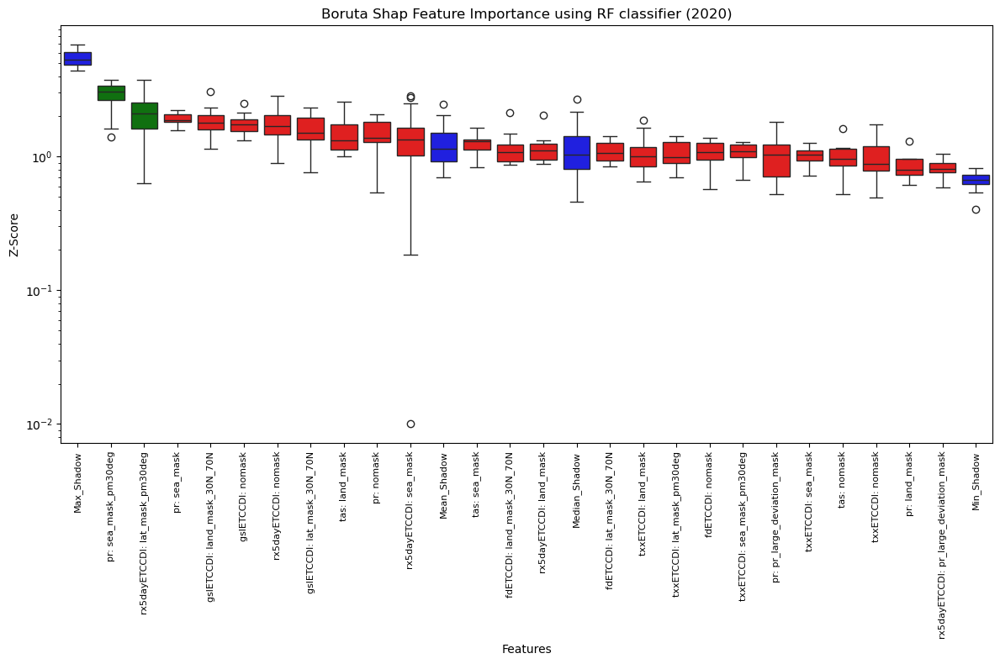

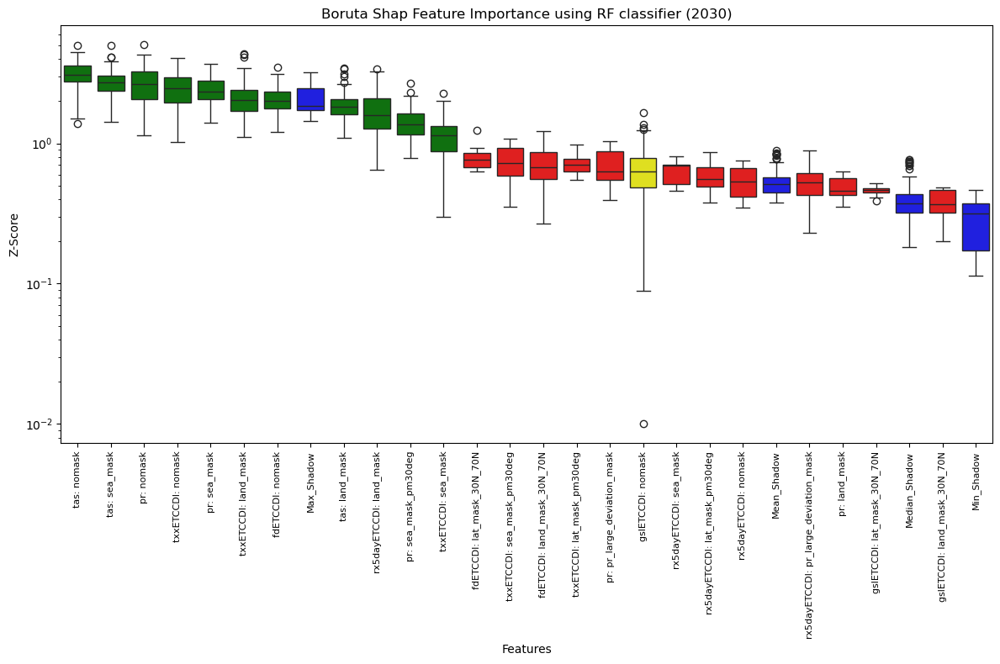

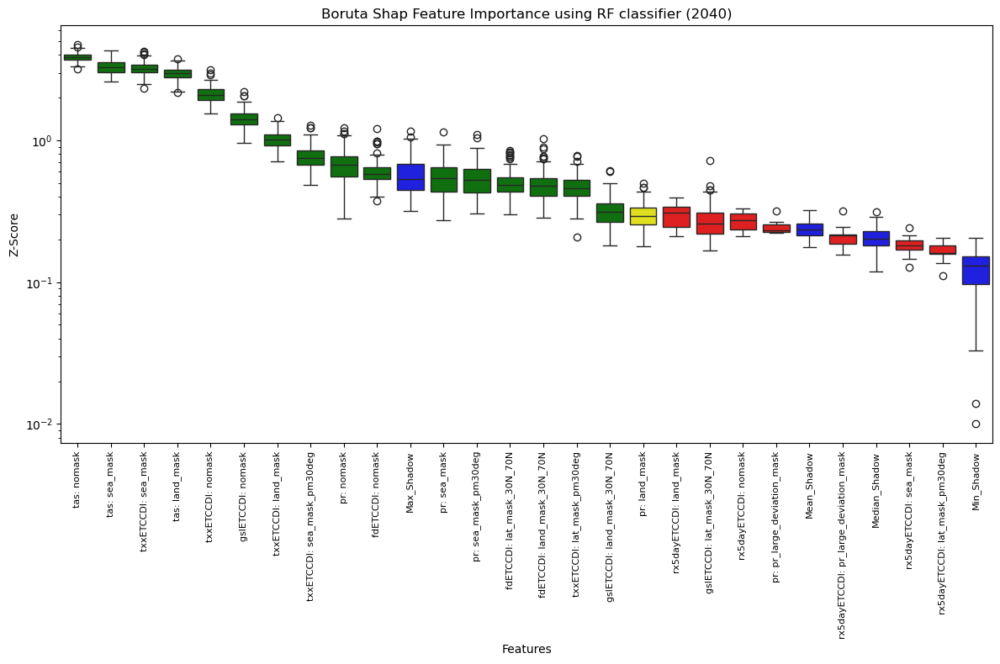

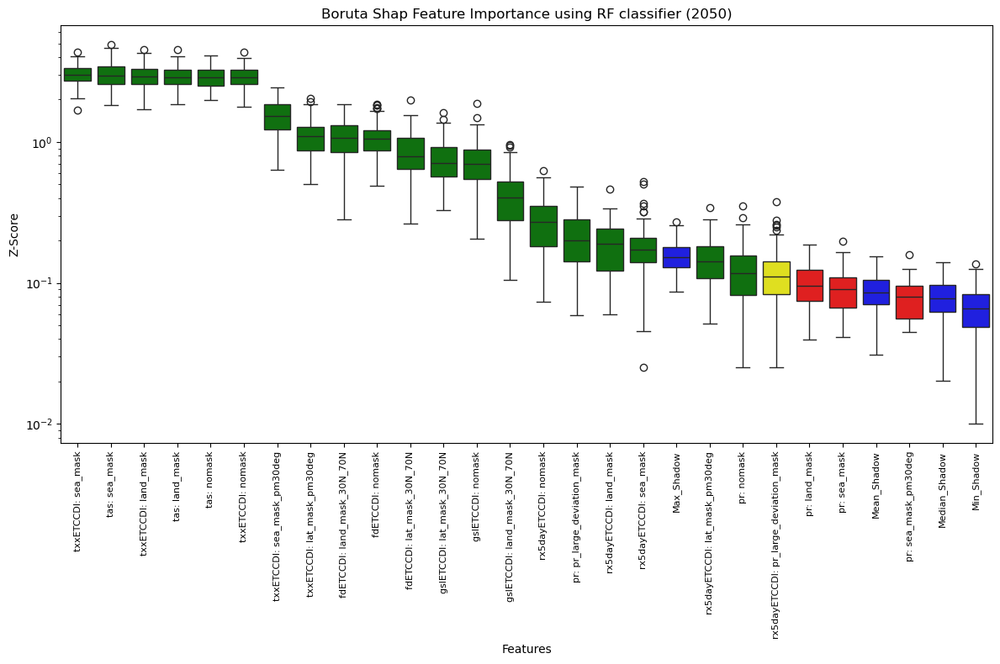

In [2]:
param_grid = {
    'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 5)],
    'max_depth': [None] + [int(x) for x in np.linspace(10, 110, num = 5)],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
    }

rand_search_kwgs = {
        'n_iter': 50, # Covers more feature combinations (here 50 out of 4320)
        'cv': 3, # higher num decreases chance of overfitting 
        'verbose': 0,
        'n_jobs': -1
    }

run_boruta_shap(
    scaled_cross_sections, 
    model_name='RF', 
    years=list(range(2020, 2051)),
    param_grid=param_grid,
    rand_search_kwgs=rand_search_kwgs, 
    plot=True,
    save_plot=True,     
    display_plot=False       
)

The boruta(SHAP) alg outputs both positive and negative importance values. The feature usefulness is not interpretable from these unless the shadow features are evaluated  at the same time. Since we are looking at a range of years we insted use the more interpretable accept/reject/tentative output. Here we plot the accept frequencies and leave out tentative features as these are, as seen from the boruta-shap z-scores plot above, not the most reliable ones. 

In [2]:
import pandas as pd
from src.plotting import *

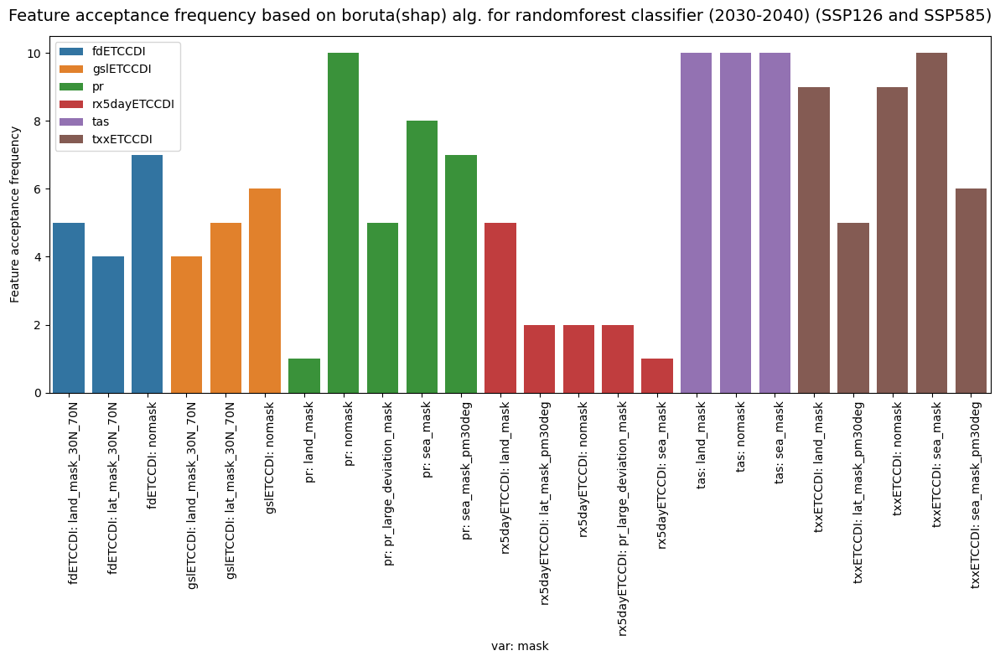

Boruta(SHAP) features for 2030-2040: ['pr: nomask', 'pr: sea_mask', 'tas: land_mask', 'tas: nomask', 'tas: sea_mask', 'txxETCCDI: land_mask', 'txxETCCDI: nomask', 'txxETCCDI: sea_mask']


In [3]:
period = (2030, 2040)

boruta_decisions_df = pd.read_csv('/nird/home/johannef/Masterthesis_S23 DataFiles/tables/feature_selection/Boruta_shap_RF_decisions_ssp126ssp585.csv')
boruta_decisions_df = boruta_decisions_df[boruta_decisions_df['year'].isin(list(range(period[0], period[1])))]

features = [col for col in boruta_decisions_df.columns if col not in ['year']]

for feature in features:
    boruta_decisions_df[feature] = boruta_decisions_df[feature].replace({'Accepted': 1, 'Rejected': 0, 'Tentative': 0})

plot_cumulative_mRMR_scores(
    boruta_decisions_df, 
    period=period, 
    title=f'Feature acceptance frequency based on boruta(shap) alg. for randomforest classifier ({period[0]}-{period[1]}) (SSP126 and SSP585)',
    filter_name='boruta',
    save=True,
    save_name='boruta_acceptedrate_2030to2040_ssp126andssp585.png',
    fontsize=14,
    include_rank_paste=False, 
    y_label='Feature acceptance frequency'

)

boruta_RF_feature_names = [feature for feature in boruta_decisions_df.columns if boruta_decisions_df[feature].sum() >= 8 and feature != 'year']
print(f'Boruta(SHAP) features for {period[0]}-{period[1]}: {boruta_RF_feature_names}')

## XGB

100%|██████████| 500/500 [00:19<00:00, 26.17it/s]


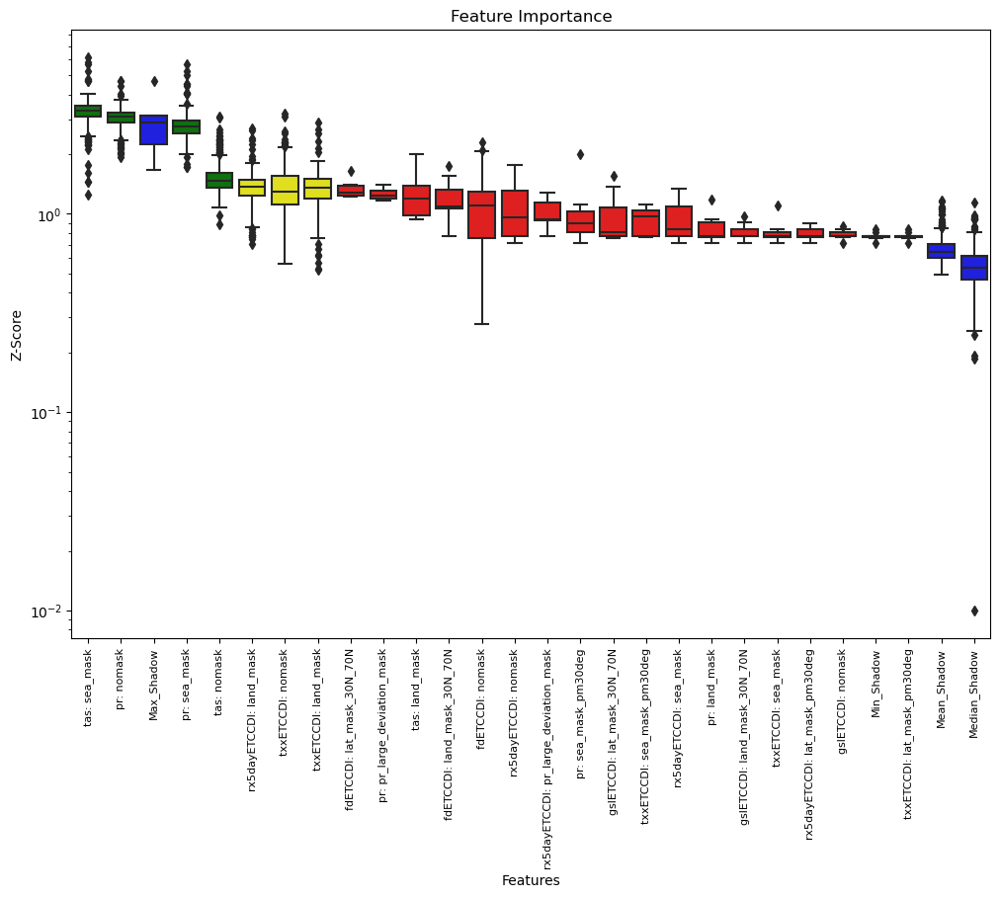

In [39]:
from xgboost import XGBClassifier

features = [col for col in scaled_cross_sections[2015].columns if col not in ['scenario', 'scenario_indx']]


cross_section_df = scaled_cross_sections[2030]
X = cross_section_df[features]
y = cross_section_df['scenario_indx']

model = XGBClassifier()

Feature_Selector = BorutaShap(model=model,
                                importance_measure='shap',
                                classification=True)    

Feature_Selector.fit(X=X, y=y, n_trials=500, sample=False, verbose=False)
Feature_Selector.results_to_csv(filename='/nird/home/johannef/Masterthesis_S23 DataFiles/tables/feature_selection/boruta_shap_RF_results')
Feature_Selector.plot(which_features='all')

## Using minimum redundancy maximum relevance (mRMR) algorithm 

mRMR is a multivariate filter method, that is, it ranks the feature importance withou using a classification algorithm. It also consider feature interactions as it assess feature correlations also. The interpretation of the mRMR output base on [this article](https://towardsdatascience.com/mrmr-explained-exactly-how-you-wished-someone-explained-to-you-9cf4ed27458b):

- **Relevance**: The algorithm identifies features that have a high correlation or mutual information with the target variable. These features are considered relevant for predicting or explaining the target variable.
- **Redundancy**: mRMR aims to select features that are dissimilar or minimally redundant with each other. This helps in capturing unique information from each selected feature without unnecessary overlap.
- **Feature Selection**: The output of mRMR typically provides a ranking or selection of features based on their relevance and redundancy scores. Features with high relevance and low redundancy are ranked higher in importance for predicting the target variable.
- **Optimal Subset**: mRMR aims to find an optimal subset of features that collectively maximize relevance to the target variable while minimizing redundancy among the selected features. This subset is crucial for building accurate predictive models.

To run alg the documentation is found [here](https://pypi.org/project/mrmr-selection/)

In [ ]:
import pandas as pd
import numpy as np

from mrmr import mrmr_classif
from tqdm import tqdm

from src.plotting import *
from src.helperfunctions_ML import open_cross_sections

scaled_cross_sections = open_cross_sections(scaled=True)

In [ ]:
features = [col for col in scaled_cross_sections[2015].columns if col not in ['scenario', 'scenario_indx']]
years = list(range(2015, 2101))

mRMR_scores_df = pd.DataFrame(columns=['year']+features, index=range(len(years)))
for indx, year in tqdm(enumerate(years)):
    cross_section_df = scaled_cross_sections[year]
    X = cross_section_df[features]
    y = cross_section_df['scenario_indx']
    
    mRMR_results = mrmr_classif(X, y,
                                K=10, return_scores=True, show_progress=False)
    mRMR_scores_df.loc[indx] = [year] + mRMR_results[1].tolist()

mRMR_scores_df.to_csv('/nird/home/johannef/Masterthesis_S23 DataFiles/tables/feature_selection/mRMR_scores_scaled_ssp126ssp585.csv', index=False)

In [ ]:
period = (2030, 2040)
mRMR_scores_df_scaled = pd.read_csv('D:/Programmering/msc/MSc_Datafiles_040424/tables/feature_selection/mRMR_scores_scaled_ssp126ssp585.csv')

old_columns = mRMR_scores_df_scaled.columns
new_columns = [col.replace('ETCCDI', '') for col in old_columns]
mRMR_scores_df_scaled.columns = new_columns

plot_data = plot_cumulative_mRMR_scores(
    mRMR_scores_df_scaled, 
    period=period, 
    title=f'Cumulative mRMR scores based on scaled data ({period[0]}-{period[1]}) (SSP126 and SSP585)',
    filter_name='mRMR',
    save=True, 
    save_name='cumulative_mRMR_scores_2015to2040_ssp126andssp585.png',
    return_plot_data=True
)

animate_scores_barplot(
    mRMR_scores_df_scaled, 
    period=period,
    title=f'Cumulative mRMR-scores based on scaled data (SSP126 and SSP585)', 
    filter_name='mRMR', 
    save_name=f'mRMR_scores_animation_ssp126andssp585.gif'
)

print(f'mRMR features for {period[0]}-{period[1]}: {plot_data[plot_data["rank"].between(1, 10)]["var: mask"].tolist()}')

## Using univariate filter methods (f-score, mutual information)

The f-score filter method meassures the differences between the ditributions given the scenarios (SSPs). It is based on the univariate ANOVA (one way anova) test and thus does NOT consider feature interactions when filtering. Central assumptions is that the feature ough to be normally distributed with the same variance. The figure in '06 - Variance analysis to detect SSP differences early.ipynb' under the header MANOVA adequacy checking show few violations for the shapiro wilks test and thus I consider the assumption to be met here. Note however that the shapiro-wilks test is only performed for 'nomask', 'land_mask' and 'sea_mask' climatologies. The higher f_value indicate a more important feature.

In [8]:
from sklearn.feature_selection import f_classif, mutual_info_classif

In [48]:
features = [col for col in scaled_cross_sections[2015].columns if col not in ['scenario', 'scenario_indx']]
f_score_df = pd.DataFrame(columns=['year']+features, index=range(len(years)))
mut_info_score_df = pd.DataFrame(columns=['year']+features, index=range(len(years)))

for indx, year in tqdm(enumerate(years)):
    cross_section_df = scaled_cross_sections[year]
    X = cross_section_df[features]
    y = cross_section_df['scenario'].astype('category')
    
    f_scores, f_p_value = f_classif(X,y)
    f_scores = f_scores.tolist()
    f_scores.insert(0, year)
    f_score_df.loc[indx] = f_scores

    mut_info_score = mutual_info_classif(X,y)
    mut_info_score = mut_info_score.tolist()
    mut_info_score.insert(0, year)
    mut_info_score_df.loc[indx] = mut_info_score

f_score_df.to_csv('/nird/home/johannef/Masterthesis_S23 DataFiles/tables/feature_selection/f_scores_ssp126ssp585.csv', index=False)
mut_info_score_df.to_csv('/nird/home/johannef/Masterthesis_S23 DataFiles/tables/feature_selection/mut_info_scores_ssp126ssp585.csv', index=False)

86it [00:02, 31.68it/s]


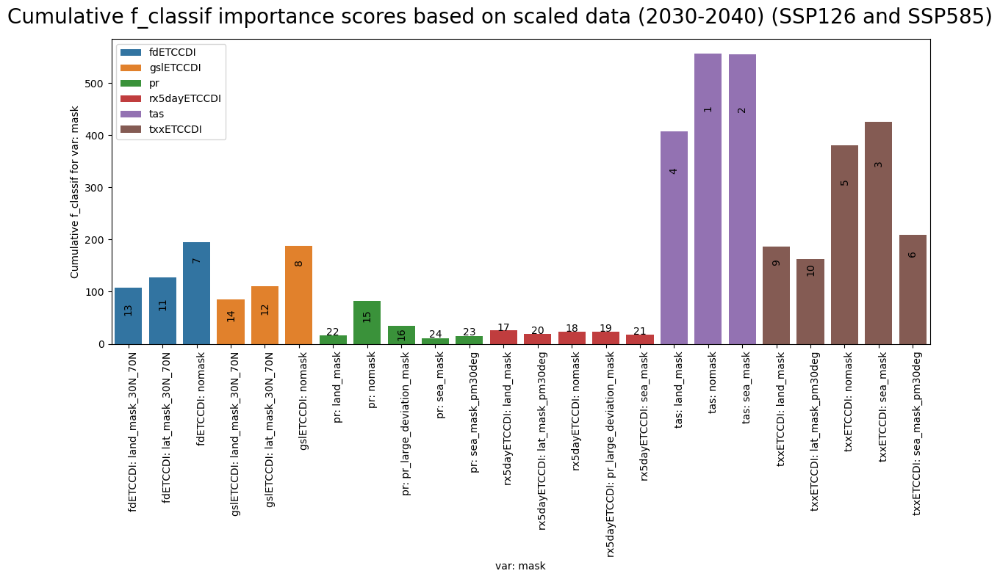

f_classif features for 2030-2040: ['fdETCCDI: nomask', 'gslETCCDI: nomask', 'tas: land_mask', 'tas: nomask', 'tas: sea_mask', 'txxETCCDI: land_mask', 'txxETCCDI: lat_mask_pm30deg', 'txxETCCDI: nomask', 'txxETCCDI: sea_mask', 'txxETCCDI: sea_mask_pm30deg']


In [7]:
period = (2030, 2040)
f_score_df = pd.read_csv('/nird/home/johannef/Masterthesis_S23 DataFiles/tables/feature_selection/f_scores_ssp126ssp585.csv')

plot_data = plot_cumulative_mRMR_scores(
    f_score_df, 
    period=period, 
    title=f'Cumulative f_classif importance scores based on scaled data ({period[0]}-{period[1]}) (SSP126 and SSP585)', 
    filter_name='f_classif',
    save=True, 
    save_name='cumulative_f_classifimportance_scores_2030to2040_ssp126andssp585.png',
    return_plot_data=True
)
animate_scores_barplot(
    f_score_df, 
    period=period,
    title=f'Cumulative f_classif importance scores based on scaled data (SSP126 and SSP585)', 
    filter_name='f_classif', 
    save_name=f'f_classif_scores_animation_ssp126andssp585.gif'
)

print(f'f_classif features for {period[0]}-{period[1]}: {plot_data[plot_data["rank"].between(1, 10)]["var: mask"].tolist()}')

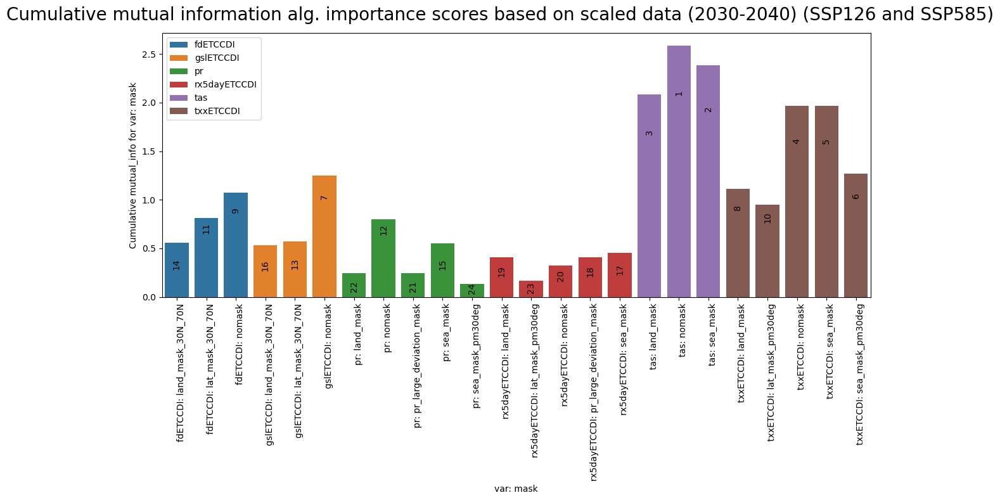

Mutual information features for 2030-2040: ['fdETCCDI: nomask', 'gslETCCDI: nomask', 'tas: land_mask', 'tas: nomask', 'tas: sea_mask', 'txxETCCDI: land_mask', 'txxETCCDI: lat_mask_pm30deg', 'txxETCCDI: nomask', 'txxETCCDI: sea_mask', 'txxETCCDI: sea_mask_pm30deg']


In [9]:
period = (2030, 2040)
mut_info_score_df = pd.read_csv('/nird/home/johannef/Masterthesis_S23 DataFiles/tables/feature_selection/mut_info_scores_ssp126ssp585.csv')
                            
plot_data = plot_cumulative_mRMR_scores(
    mut_info_score_df, 
    period=period, 
    title='Cumulative mutual information alg. importance scores based on scaled data (2030-2040) (SSP126 and SSP585)',
    filter_name='mutual_info',
    save=True,
    save_name='cumulative_mutualinfoimportance_scores_2030to2040_ssp126andssp585.png',
    return_plot_data=True
)
animate_scores_barplot(
    mut_info_score_df, 
    period=period,
    title=f'Cumulative mutual information alg. importance scores based on scaled data (SSP126 and SSP585)', 
    filter_name='mutual_info', 
    save_name=f'mutual_info_scores_animation_ssp126andssp585.gif'
)
print(f'Mutual information features for {period[0]}-{period[1]}: {plot_data[plot_data["rank"].between(1, 10)]["var: mask"].tolist()}')

# Assessing the feature combinations

In [48]:
from src.helperfunctions_ML import open_cross_sections
import pandas as pd
import numpy as np
from statsmodels.multivariate.manova import MANOVA
import statsmodels.api as sm
from statsmodels.formula.api import ols

import itertools
from tqdm import tqdm

In [49]:
cross_sections = open_cross_sections(scaled=False)

In [50]:

GSAT = ['tas: nomask']
nomask_features = ['fdETCCDI: nomask', 'gslETCCDI: nomask', 'pr: nomask', 'tas: nomask', 'txxETCCDI: nomask']
boruta_RF_features = ['pr: nomask', 'pr: sea_mask', 'tas: land_mask', 'tas: nomask', 'tas: sea_mask', 'txxETCCDI: land_mask', 'txxETCCDI: nomask', 'txxETCCDI: sea_mask']
mRMR_f_mut_features = ['fdETCCDI: nomask', 'gslETCCDI: nomask', 'tas: land_mask', 'tas: nomask', 'tas: sea_mask', 'txxETCCDI: land_mask', 'txxETCCDI: lat_mask_pm30deg', 'txxETCCDI: nomask', 'txxETCCDI: sea_mask', 'txxETCCDI: sea_mask_pm30deg']
johannes_supervised_features = ['fdETCCDI: nomask', 'pr: nomask', 'pr: sea_mask', 'rx5dayETCCDI: land_mask', 'tas: nomask', 'txxETCCDI: sea_mask']

feature_combinations = {
    'GSAT': GSAT,
    'nomask_baseline': nomask_features, 
    'boruta_RF_features': boruta_RF_features,
    'mRMR_f_mut_features': mRMR_f_mut_features,
    'supervised_features': johannes_supervised_features
}

years = np.linspace(2015, 2050, (2050-2015)+1, dtype=int)

def preprocess_for_anova(df, factors, variables):

    new_variable_names = [str.replace(': ', '_') for str in variables]
    df.rename(columns=dict(zip(variables, new_variable_names)), inplace=True)

    df = df.loc[:, factors + new_variable_names]  # Keep only columns in factors or variables

    for variable in new_variable_names:
        df[variable] = df[variable].astype(np.float32)
        
    for factor in factors:
        df[factor] = df[factor].astype('category')
    
    return df, new_variable_names

In [51]:
p_values_df = pd.DataFrame(columns=['Year', 'Feature combination', 'Wilks Lambda'],#, 'Pillai\'s Trace'], 
                           index=range(len(feature_combinations)*len(years)))
indx = 0
for year in years:
    cross_section = cross_sections[year]
    for feature_combination_name, features in feature_combinations.items():

        df, new_variable_names = preprocess_for_anova(cross_section, factors=['scenario'], variables=features)

        var_comb_str = '+'.join(new_variable_names)  +'~ scenario'

        if feature_combination_name == 'GSAT':
            model = ols(var_comb_str, data=df).fit()
            aov_table = sm.stats.anova_lm(model, typ=2) 
            
            p_val = aov_table['PR(>F)'].iloc[0]
        else:
            manova_results = MANOVA.from_formula(var_comb_str, data=df)
            # get the p-value for the Wilks' Lambda
            p_val = manova_results.mv_test().results['scenario']['stat']['Pr > F'].iloc[0]
        
        p_values_df.loc[indx] = [year, feature_combination_name, p_val] #, pillaistrace]
        indx += 1

p_values_df


,Year,Feature combination,Wilks Lambda
0,2015,GSAT,0.926414
1,2015,nomask_baseline,0.845607
2,2015,boruta_RF_features,0.876555
3,2015,mRMR_f_mut_features,0.795844
4,2015,supervised_features,0.419868
...,...,...,...
175,2050,GSAT,0.0
176,2050,nomask_baseline,0.0
177,2050,boruta_RF_features,0.0
178,2050,mRMR_f_mut_features,0.0


In [52]:
def last_observation_above_threshold(df, threshold):
    
    report = {}
    for feature_comb in df['Feature combination'].unique():
        
        feature_comb_df = df[df['Feature combination'] == feature_comb]
        last_observation = np.where(feature_comb_df['Wilks Lambda'] > threshold)[0][-1] # this is the index of the last year where p > 0.05
        first_year_bellow_threshold = feature_comb_df.iloc[last_observation]['Year'] + 1 # this is the first year where p < 0.05

        report[feature_comb] = first_year_bellow_threshold
        
    return report

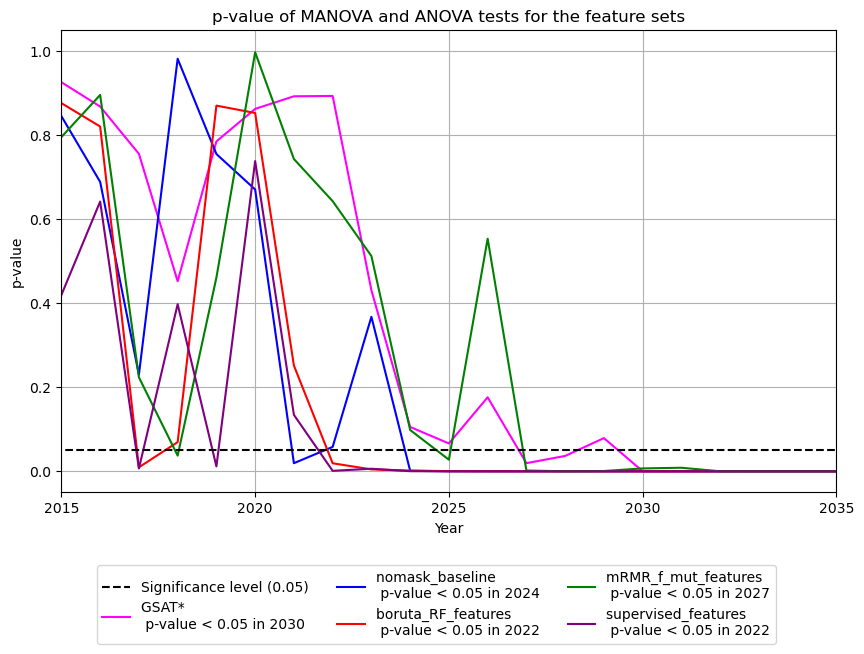

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

full_palette = ['magenta', 'blue', 'red', 'green', 'purple',]
fig, ax = plt.subplots(figsize=(10, 6))


sns.lineplot(
    data=p_values_df, 
    x='Year', 
    y='Wilks Lambda', 
    hue='Feature combination', 
    palette=full_palette,
    ax=ax,
    legend=False
    )

ax.set_ylim(-0.05, 1.05)
ax.set_xlim(2015, 2035)
ax.set_xticks(range(2015, 2036, 5))
ax.set_ylabel('p-value')
ax.set_title('p-value of MANOVA and ANOVA tests for the feature sets')
ax.hlines(0.05, xmin=2010, xmax=2035, linestyle='--', color='black', label='Significance level (0.05)')
ax.grid(True)

last_observation_above_threshold = last_observation_above_threshold(p_values_df, 0.05)

labels = ['Significance level (0.05)']+[f"{key} \n p-value < 0.05 in {crossing_year}" for key, crossing_year in last_observation_above_threshold.items()]
labels[1] = labels[1].replace('GSAT', 'GSAT*')
handles = [plt.Line2D([0], [0], color=color, label=label, linestyle='dashed' if i == 0 else 'solid') for i, (color, label) in enumerate(zip(['black']+full_palette, labels))]
fig.legend(
    handles=handles, 
    loc='upper center', 
    bbox_to_anchor=(0.5, 0), 
    ncols=3
    )  # Put the legend below the plot

plt.show()


- run MANOVA 
- rund PCA (Another use of dimensionality reduction in the context of evaluating features is for visualization: in a lower-dimensional space, it is easier to visually verify if the data is potentially separable, which helps to set expectations on the classification accuracy. In practice, we perform dimensionality reduction (e.g. PCA) over a subset of features and check how the labels are distributed in the reduced space. If they appear to be separate, this is a clear sign that high classification performance is expected when using this set of features.)

In [54]:
labels
labels[1] = labels[1].replace('GSAT', 'GSAT*')
labels

['Significance level (0.05)',
 'GSAT** \n p-value < 0.05 in 2030',
 'nomask_baseline \n p-value < 0.05 in 2024',
 'boruta_RF_features \n p-value < 0.05 in 2022',
 'mRMR_f_mut_features \n p-value < 0.05 in 2027',
 'supervised_features \n p-value < 0.05 in 2022']